This practice session aims to extract automatically building footprints from aerial images of the state of Massachusetts. We want to approximate the function mapping input images to a binary prediction for each pixel (i.e. semantic segmentation) using the U-Net convolutional network architecture [(Ronneberger et al. 2015)](https://link.springer.com/chapter/10.1007/978-3-319-24574-4_28). For this assignment, the GPU implementation of TensorFlow is recommended, but students preferring PyTorch can use this framework instead.

The image data consists of 3347 colour raster of dimension 256x256x3 using the NAD83 (EPSG:26986) projection system. Each raster represents an area of 300 square meters. The label data consists of building footprints vectors extracted from [OpenStreetMap](https://www.openstreetmap.org/relation/61315) and converted into a binary raster with the same extent and resolution as the image rasters. The unformatted data was provided by Minh (2013) and can be accessed on his [website](http://www.cs.toronto.edu/~vmnih/data/). Images and labels are randomly partitioned into a training (70%) validation (15%) and test sample (15%).

Tensorflow Keras documentation:
- [Convolution](https://keras.io/api/layers/convolution_layers/)
- [Activation](https://keras.io/api/layers/activations/)
- [Pooling](https://keras.io/api/layers/pooling_layers/)
- [Regularisation](https://keras.io/api/layers/regularization_layers/)
- [Optimisers](https://keras.io/api/optimizers/)
- [Metrics](https://keras.io/api/metrics/)
- [Losses](https://keras.io/api/losses/)
- [Callbacks](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks)

![U-Net model](homework_model.jpg)

In [2]:
# Modules
# https://www.youtube.com/watch?v=o4-bI_iZKPA GPU tensorflow install
import numpy as np
import os
import tensorflow

from tensorflow.keras import callbacks, layers, losses, metrics, models, optimizers, preprocessing, utils
from utilities import *

In [3]:
# Checks tensorFlow
print('TensorFlow version:', tensorflow.__version__)
print('GPU available:', len(tensorflow.config.list_physical_devices('GPU')))

# Defines paths
paths = dict(
    images_train='data/training/images',
    labels_train='data/training/labels',
    images_valid='data/validation/images',
    labels_valid='data/validation/labels',
    images_test= 'data/test/images',
    labels_test= 'data/test/labels'
)

TensorFlow version: 2.12.0
GPU available: 1


1. Load the images and labels for the training and validation samples as separate `numpy.ndarray` of dimensions $n \times h \times w \times d$. You can use the provided `search_files` and `read_raster` utility functions. Normalise the images between 0 and 1 and set the labels data type as float.

In [4]:
directory = os.getcwd()
data_dir = directory + '/data'

In [7]:
images_train = np.array([read_raster(file, dtype=np.ubyte) for file in search_files(paths['images_train'],   pattern='tif$')])
labels_train = np.array([read_raster(file, dtype='float') for file in search_files(paths['labels_train'],   pattern='tif$')])

images_valid = np.array([read_raster(file, dtype=np.ubyte) for file in search_files(paths['images_valid'], pattern='tif$')])
labels_valid = np.array([read_raster(file, dtype='float') for file in search_files(paths['labels_valid'],    pattern='tif$')])

images_test  = np.array([read_raster(file, dtype=np.ubyte) for file in search_files(paths['images_test'],    pattern='tif$')])
labels_test  = np.array([read_raster(file, dtype='float') for file in search_files(paths['labels_test'],    pattern='tif$')])

In [8]:
#Normalise the images between 0 and 1
def normalize(images):
    normalized = []
    for image in range(len(images)):
        normalized_img = images[image]/255
        normalized.append(normalized_img)
    return np.array(normalized)

images_train = normalize(images_train)
images_valid = normalize(images_valid)
images_test = normalize(images_test)

2. For the training and validation samples, check the dimensions of the images and labels arrays. Display several matching image and label pairs to ensure correspondence. You can use the provided `compare` utility function.

In [10]:
# For the training and validation samples, check the dimensions of the images and labels arrays
print('Image Dimensions:')
print(images_train[0].shape)
print(images_valid[0].shape)


print('Dataset dimensions:')
print(images_train.shape)
print(labels_train.shape)

print(images_valid.shape)
print(labels_valid.shape)

Image Dimensions:
(256, 256, 3)
(256, 256, 3)
Dataset dimensions:
(2343, 256, 256, 3)
(2343, 256, 256, 1)
(502, 256, 256, 3)
(502, 256, 256, 1)


training set ----------------------------


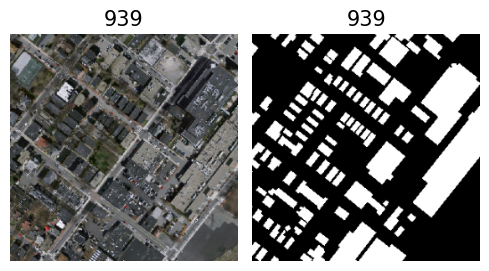

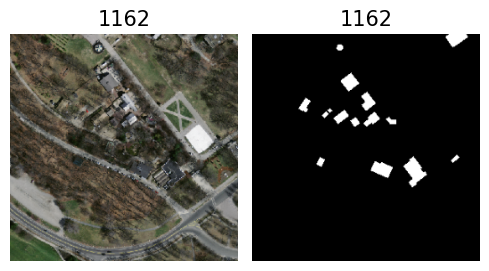

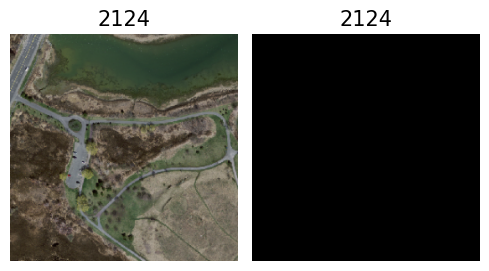

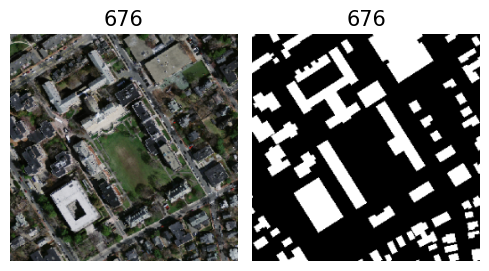

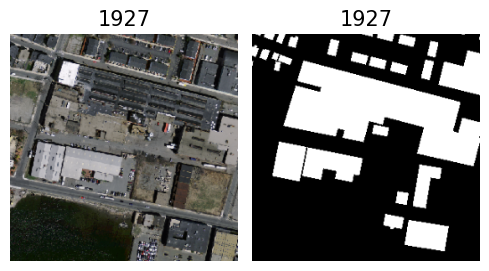

validation set --------------------------


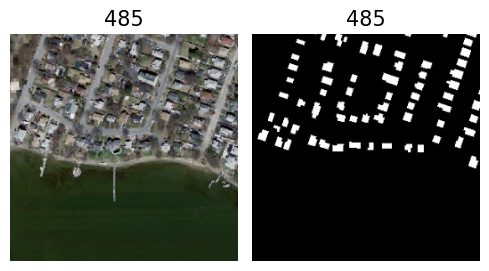

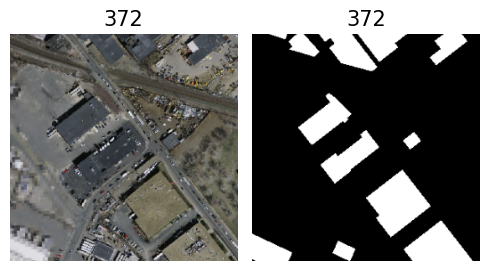

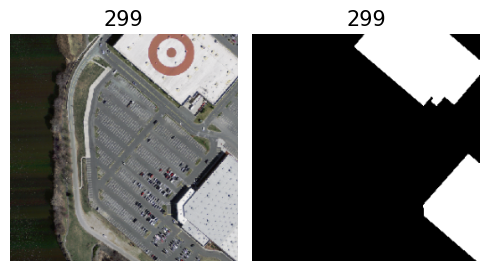

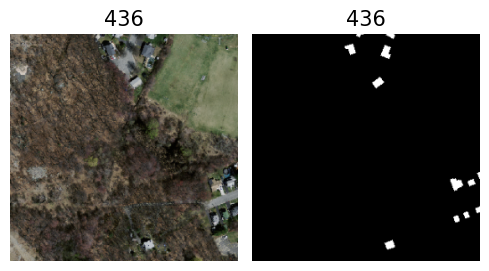

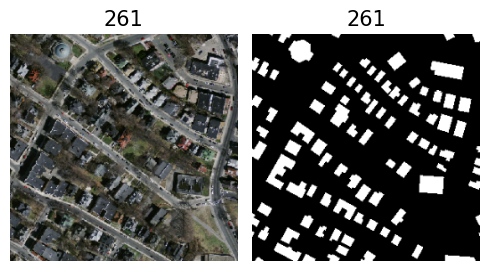

In [11]:
# Display several matching image and label pairs to ensure correspondence. You can use the provided compare utility function.

print('training set ----------------------------')
for i in np.random.choice(range(len(images_train)), 5, replace=False):
    compare([images_train[i],labels_train[i]], [i, i])
    
print('validation set --------------------------')
for i in np.random.choice(range(len(images_valid)), 5, replace=False):
    compare([images_valid[i],labels_valid[i]], [i, i])

3. Using the Keras functional API, define a simplified U-Net model with the number of kernels indicated in the figure above (i.e. 8, 16, 32, 64, 128, ...). There are numerous implementation examples of U-Nets using Keras. Choose the appropriate activation functions for the hidden layers and the output layer, and the corresponding parameter initialisation method.

In [23]:
# imgage dimensions for input layer
img_width = 256
img_height = 256
img_channels = 3

In [11]:
# initial layer weights: 
# 'he_normal'is truncated but not quite the same as 'truncated_normal' vs 'he_uniform' 
# for more options: https://keras.io/api/layers/initializers/
initializer = 'he_normal'  

In [70]:
inputs = layers.Input(shape=(img_width, img_height, img_channels))

#Encoder block 1
c1 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='enconder1_convlayer1')(inputs)
c1 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder1_convlayer2')(c1)
p1 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder1_poollayer1')(c1)

#Encoder block 2
c2 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder2_convlayer1')(p1)
c2 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder2_convlayer2')(c2)
p2 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder2_poollayer1')(c2)

#Encoder block 3
c3 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder3_convlayer1')(p2)
c3 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder3_convlayer2')(c3)
p3 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder3_poollayer1')(c3)

#Encoder block 4
c4 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder4_convlayer1')(p3)
c4 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder4_convlayer2')(c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder4_poollayer1')(c4)

#Encoder block 5 (bottleneck)
c5 = layers.Conv2D(filters=128, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder5_convlayer1')(p4)
c5 = layers.Conv2D(filters=128, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder5_convlayer2')(c5)

#Decoder block 1
u6 = layers.Conv2DTranspose(filters=64, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_transposelayer1')(c5)
s6 = layers.Concatenate()([u6, c4])
c6 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_convlayer1')(s6)
c6 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_convlayer2')(c6)

#Decoder block 2
u7 = layers.Conv2DTranspose(filters=32, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_transposelayer1')(c6)
s7 = layers.Concatenate()([u7, c3])
c7 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_convlayer1')(s7)
c7 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_convlayer2')(c7)

#Decoder block 3
u8 = layers.Conv2DTranspose(filters=16, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_transposelayer1')(c7)
s8 = layers.Concatenate()([u8, c2])
c8 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_convlayer1')(s8)
c8 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_convlayer2')(c8)

#Decoder block 4
u9 = layers.Conv2DTranspose(filters=8, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_transposelayer1')(c8)
s9 = layers.Concatenate()([u9, c1])
c9 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_convlayer1')(s9)
c9 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_convlayer2')(c9)

output = layers.Conv2D(filters=1, kernel_size=(5,5),padding='same', activation='sigmoid', kernel_initializer=initializer, name='output_layer')(c9)

In [71]:
model = models.Model(inputs=inputs, outputs=output, name='EM_Unet_model') 

4. Initialise and compile the model using the chosen optimisation algorithm and the appropriate loss function. Optionally, you can use the focal version of the loss function to account for the class imbalance in the training data. Print the model structure using the `summary` method.

In [64]:
# There is class imbalance
one_pixels = np.count_nonzero(labels_train)
total_pixels = labels_train.size

zero_pixels =  total_pixels - one_pixels 

print('Percentage of zero pixels:', round(zero_pixels/total_pixels, 1)*100)
print('Percentage of non-zero pixels:',round(one_pixels/total_pixels, 1) * 100)

# therefore we use Binary Focal Crossentropy as the loss function
# This function downweights correct classifications of non-building pixels 
# and upweights correct classifications of building pixels

Percentage of zero pixels: 80.0
Percentage of non-zero pixels: 20.0
Class Imbalance is present


In [62]:
optimizer_choice = 'adam' # combine Momentum and RMSProp
loss_choice = 'BinaryFocalCrossentropy'
metrics_choice = ['accuracy', 'binary_crossentropy']

In [72]:
model.compile(
    optimizer=optimizer_choice,
    loss=loss_choice,
    metrics=metrics_choice)

In [61]:
model.summary()

Model: "E&M_Unet_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 enconder1_convlayer1 (Conv2D)  (None, 256, 256, 8)  608         ['input_16[0][0]']               
                                                                                                  
 encoder1_convlayer2 (Conv2D)   (None, 256, 256, 8)  1608        ['enconder1_convlayer1[0][0]']   
                                                                                                  
 encoder1_poollayer1 (MaxPoolin  (None, 128, 128, 8)  0          ['encoder1_convlayer

5. Estimate the model parameters using the training and the validation sample. Use batch-size of 32 and a maximum of 30 training epoch. Use an early-stopping callback with a patience parameter of 3 to recover the parameters that minimise the error on the validation sample.

In [112]:
history = model.fit(
  images_train,
  labels_train,
  epochs=30, #5 were not enough for convergrence
  batch_size=32,
  callbacks=[callbacks.EarlyStopping(monitor='val_loss', patience=3)], #, min_delta=0.0001)],
  validation_data=(images_valid, labels_valid)
)

Epoch 1/30
74/74 [==============================] - 49s 666ms/step - loss: 0.0496 - accuracy: 0.8961 - binary_crossentropy: 0.2705 - val_loss: 0.0510 - val_accuracy: 0.8915 - val_binary_crossentropy: 0.2887
Epoch 2/30
74/74 [==============================] - 45s 609ms/step - loss: 0.0486 - accuracy: 0.8978 - binary_crossentropy: 0.2679 - val_loss: 0.0539 - val_accuracy: 0.8858 - val_binary_crossentropy: 0.2794
Epoch 3/30
74/74 [==============================] - 44s 599ms/step - loss: 0.0477 - accuracy: 0.8990 - binary_crossentropy: 0.2619 - val_loss: 0.0515 - val_accuracy: 0.8895 - val_binary_crossentropy: 0.2773
Epoch 4/30
74/74 [==============================] - 45s 604ms/step - loss: 0.0458 - accuracy: 0.9019 - binary_crossentropy: 0.2533 - val_loss: 0.0478 - val_accuracy: 0.8973 - val_binary_crossentropy: 0.2683
Epoch 5/30
74/74 [==============================] - 45s 610ms/step - loss: 0.0450 - accuracy: 0.9034 - binary_crossentropy: 0.2502 - val_loss: 0.0495 - val_accuracy: 0.8939

6. Display the evolution of the training and validation metrics during training using the provided `display_history` utility function. Load and format the test sample (see question 1) and evaluate the model's generalisation performance.

In [113]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss', 'accuracy', 'binary_crossentropy', 'val_loss', 'val_accuracy', 'val_binary_crossentropy'])


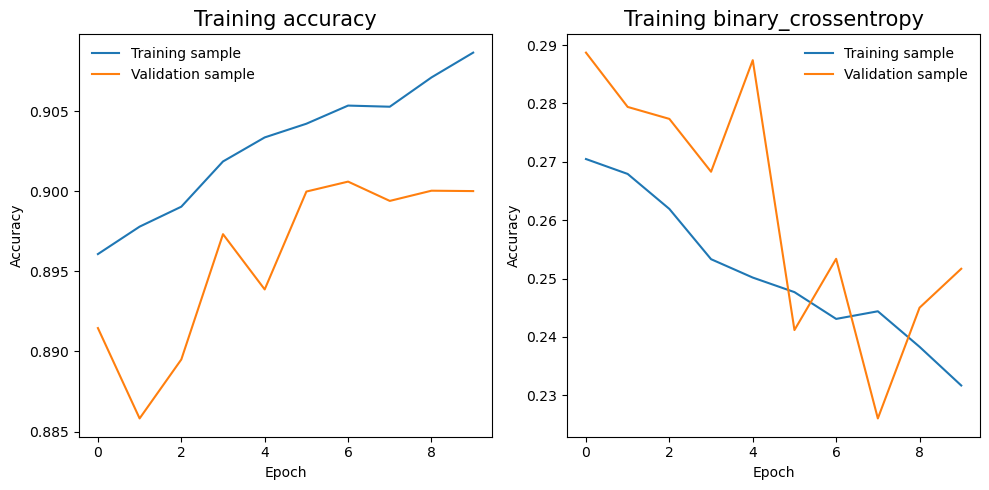

In [136]:
display_history(history_dict, metrics_choice) 

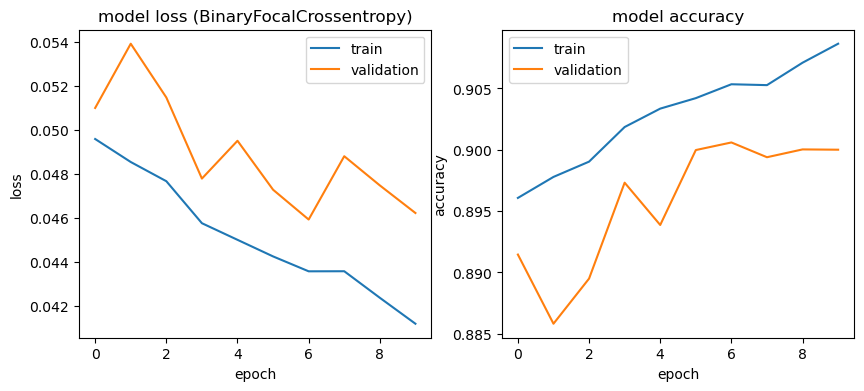

In [135]:
import matplotlib.pyplot as plt

figure, axes = plt.subplots(1, 2, figsize=(10, 4))
# loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

plt.title('model loss (BinaryFocalCrossentropy)')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')

# accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

#show
plt.show()

7. Compute the predicted probabilities for the test images. Turn the probabilities into binary predictions using a threshold of 0.5. Display prediction statistics using the provided `display_statistics` utility for several test images.

In [137]:
# Turn the probabilities into binary predictions using a threshold of 0.5
test_image_pred = model.predict(images_test)
test_image_pred_t = (test_image_pred > 0.5).astype(np.uint8)

16/16 [==============================] - 4s 237ms/step


array([[[[0.34976786],
         [0.3051087 ],
         [0.2991376 ],
         ...,
         [0.1842281 ],
         [0.23999926],
         [0.29976782]],

        [[0.33956802],
         [0.29874343],
         [0.27864265],
         ...,
         [0.12093108],
         [0.17090268],
         [0.22716504]],

        [[0.35146436],
         [0.31781015],
         [0.3035145 ],
         ...,
         [0.10462866],
         [0.13611658],
         [0.20335804]],

        ...,

        [[0.2434663 ],
         [0.15857336],
         [0.11161279],
         ...,
         [0.10414626],
         [0.13481367],
         [0.19685267]],

        [[0.27625504],
         [0.19917792],
         [0.17056632],
         ...,
         [0.16283697],
         [0.19681789],
         [0.2653747 ]],

        [[0.38175875],
         [0.310031  ],
         [0.28917488],
         ...,
         [0.2686604 ],
         [0.2811519 ],
         [0.33431837]]],


       [[[0.3715844 ],
         [0.3364938 ],
         [0.33

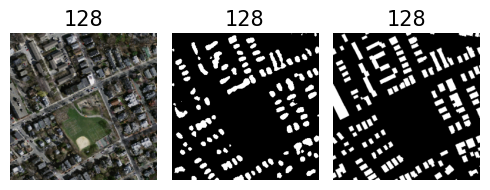

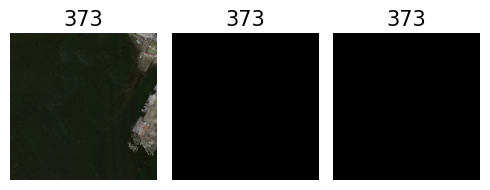

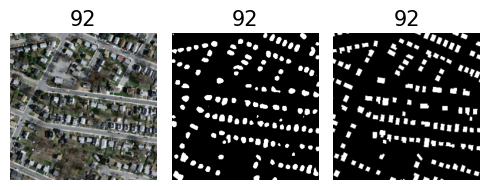

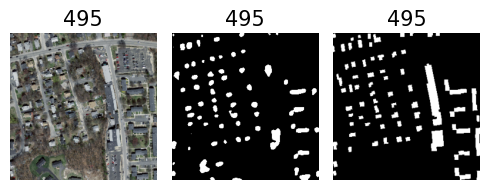

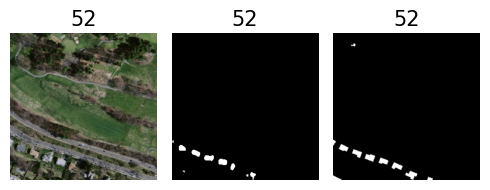

In [140]:
for i in np.random.choice(range(len(images_test)), 5, replace=False):
    compare([images_test[i],test_image_pred_t[i], labels_test[i]], [i, i,i])


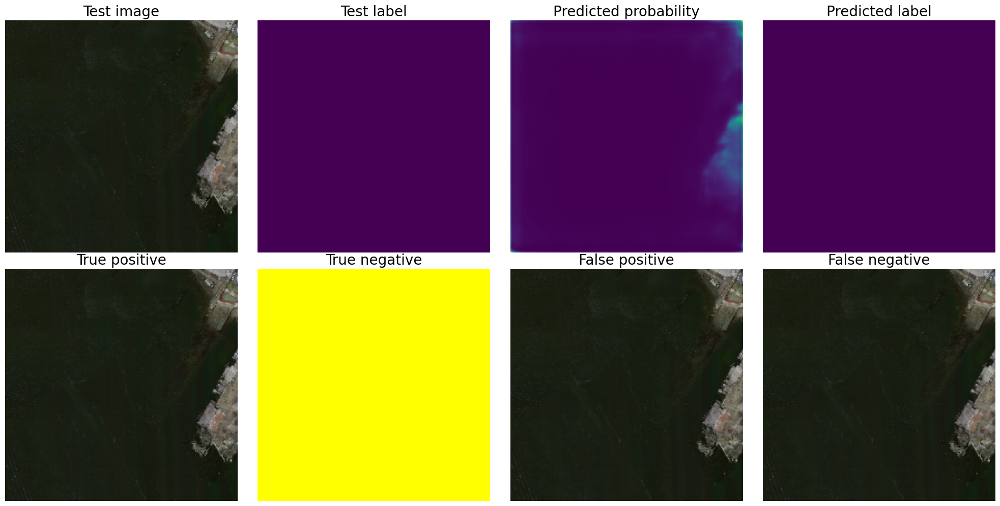

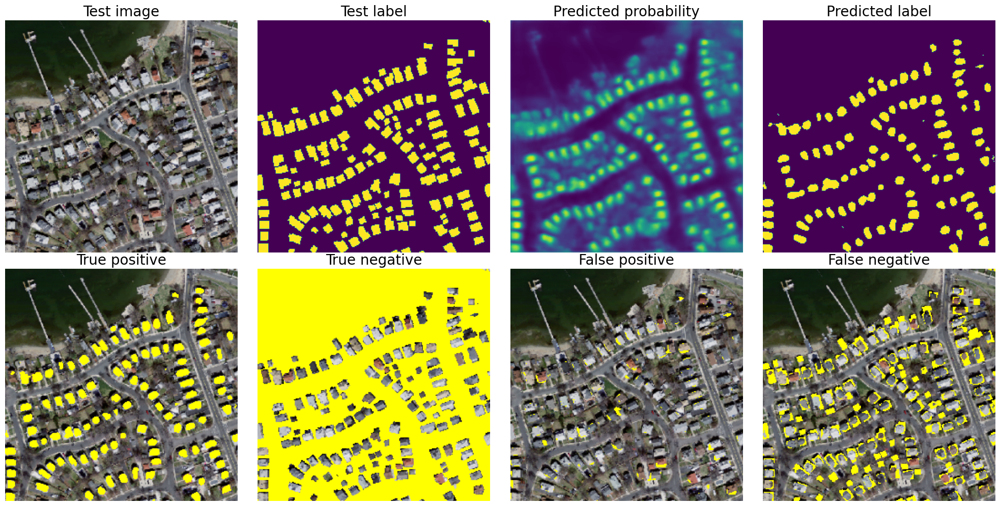

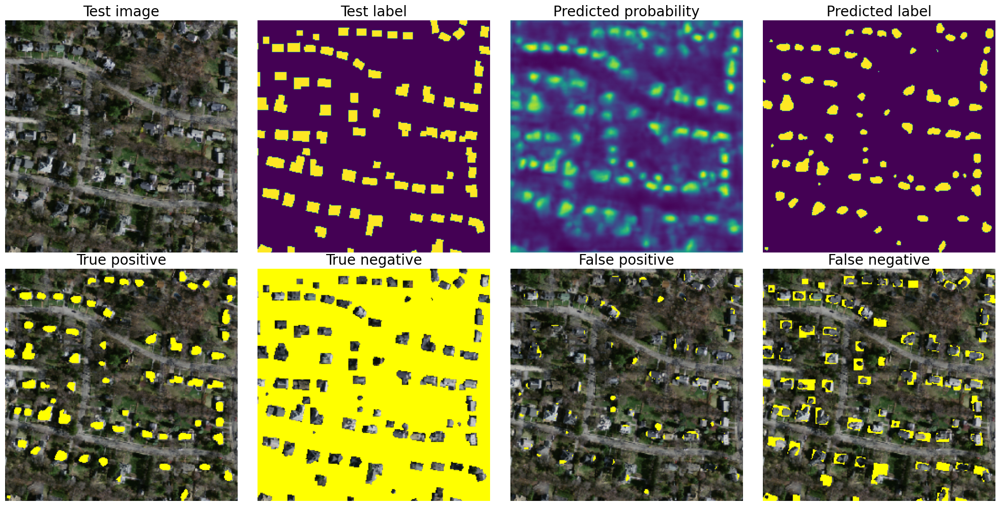

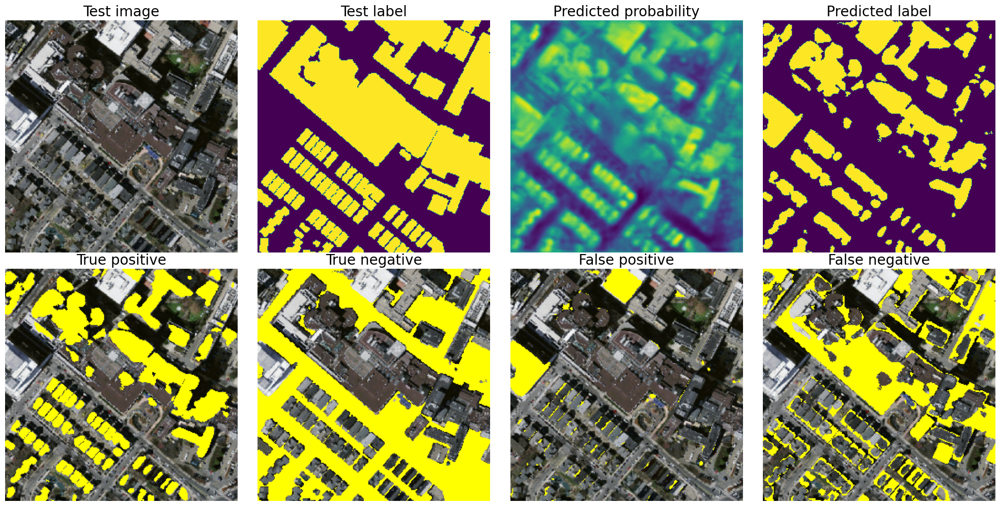

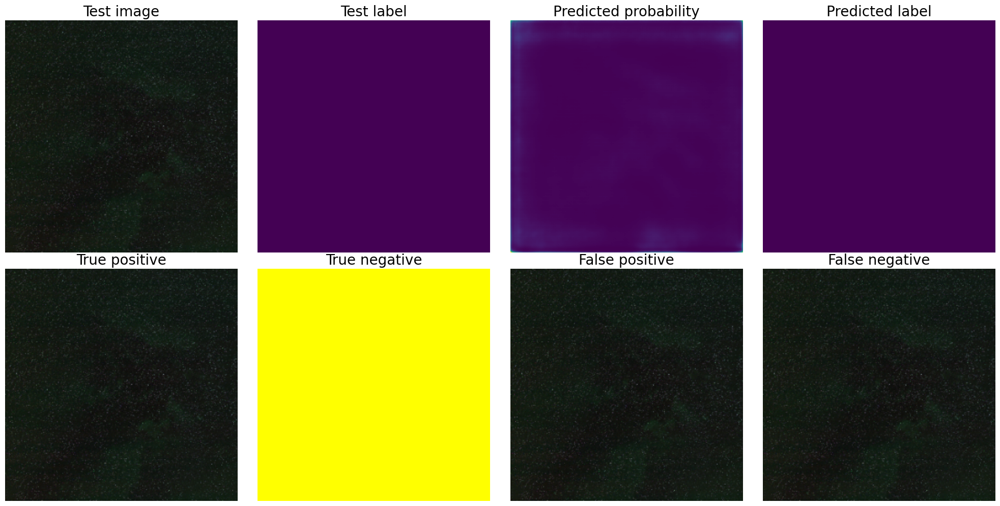

In [141]:
# Display prediction statistics using the provided display_statistics utility for several test images.
for i in np.random.choice(range(len(images_test)), 5, replace=False):
    display_statistics(images_test[i],labels_test[i], test_image_pred[i], test_image_pred_t[i])

8. **OPTIONAL** Modify the network with either batch-normalisation or spatial dropout layers to increase predictive performance. Assuming that we give equal importance to reducing false positives and false negatives, use a decision probability threshold that strikes the best balance between these two quantities.

In [142]:
inputs_2 = layers.Input(shape=(img_width, img_height, img_channels))

#Encoder block 1
c1 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='enconder1_convlayer1')(inputs_2)
c1 = layers.Dropout(0.1)(c1)
c1 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder1_convlayer2')(c1)
p1 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder1_poollayer1')(c1)

#Encoder block 2
c2 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder2_convlayer1')(p1)
c2 = layers.Dropout(0.1)(c2)
c2 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder2_convlayer2')(c2)
p2 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder2_poollayer1')(c2)

#Encoder block 3
c3 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder3_convlayer1')(p2)
c3 = layers.Dropout(0.1)(c3)
c3 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder3_convlayer2')(c3)
p3 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder3_poollayer1')(c3)

#Encoder block 4
c4 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder4_convlayer1')(p3)
c4 = layers.Dropout(0.1)(c4)
c4 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder4_convlayer2')(c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid', name='encoder4_poollayer1')(c4)

#Encoder block 5 (bottleneck)
c5 = layers.Conv2D(filters=128, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder5_convlayer1')(p4)
c5 = layers.Dropout(0.1)(c5)
c5 = layers.Conv2D(filters=128, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='encoder5_convlayer2')(c5)

#Decoder block 1
u6 = layers.Conv2DTranspose(filters=64, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_transposelayer1')(c5)
s6 = layers.Concatenate()([u6, c4])
c6 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_convlayer1')(s6)
c6 = layers.Dropout(0.1)(c6)
c6 = layers.Conv2D(filters=64, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder1_convlayer2')(c6)

#Decoder block 2
u7 = layers.Conv2DTranspose(filters=32, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_transposelayer1')(c6)
s7 = layers.Concatenate()([u7, c3])
c7 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_convlayer1')(s7)
c7 = layers.Dropout(0.1)(c7)
c7 = layers.Conv2D(filters=32, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder2_convlayer2')(c7)

#Decoder block 3
u8 = layers.Conv2DTranspose(filters=16, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_transposelayer1')(c7)
s8 = layers.Concatenate()([u8, c2])
c8 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_convlayer1')(s8)
c8 = layers.Dropout(0.1)(c8)
c8 = layers.Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder3_convlayer2')(c8)

#Decoder block 4
u9 = layers.Conv2DTranspose(filters=8, kernel_size=(5, 5), strides=(2,2), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_transposelayer1')(c8)
s9 = layers.Concatenate()([u9, c1])
c9 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_convlayer1')(s9)
c9 = layers.Dropout(0.1)(c9)
c9 = layers.Conv2D(filters=8, kernel_size=(5, 5), padding='same', activation='relu', kernel_initializer=initializer, name='decoder4_convlayer2')(c9)

output_2 = layers.Conv2D(filters=1, kernel_size=(5,5),padding='same', activation='sigmoid', kernel_initializer=initializer, name='output_layer')(c9)

In [143]:
model_2 = models.Model(inputs=inputs_2, outputs=output_2, name='EM_Unet_model_2') 

optimizer_choice = 'adam'
loss_choice = 'BinaryFocalCrossentropy'
metrics_choice = ['accuracy', 'binary_crossentropy']

model_2.compile(
    optimizer=optimizer_choice,
    loss=loss_choice,
    metrics=metrics_choice
)

model.summary()

Model: "EM_Unet_model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_20 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 enconder1_convlayer1 (Conv2D)  (None, 256, 256, 8)  608         ['input_20[0][0]']               
                                                                                                  
 dropout_18 (Dropout)           (None, 256, 256, 8)  0           ['enconder1_convlayer1[0][0]']   
                                                                                                  
 encoder1_convlayer2 (Conv2D)   (None, 256, 256, 8)  1608        ['dropout_18[0][0]'

In [134]:
history_2 = model_2.fit(
  images_train,
  labels_train,
  epochs=30, #5 were not enough for convergrence
  batch_size=32,
  callbacks=[callbacks.EarlyStopping(monitor='val_loss', patience=3)], #, min_delta=0.0001)],
  validation_data=(images_valid, labels_valid)
)

Epoch 1/30
74/74 [==============================] - 59s 729ms/step - loss: 0.1218 - accuracy: 0.8061 - binary_crossentropy: 0.5361 - val_loss: 0.0871 - val_accuracy: 0.8388 - val_binary_crossentropy: 0.4109
Epoch 2/30
74/74 [==============================] - 48s 646ms/step - loss: 0.0808 - accuracy: 0.8499 - binary_crossentropy: 0.4073 - val_loss: 0.0792 - val_accuracy: 0.8532 - val_binary_crossentropy: 0.3783
Epoch 3/30
74/74 [==============================] - 47s 638ms/step - loss: 0.0764 - accuracy: 0.8585 - binary_crossentropy: 0.3860 - val_loss: 0.0736 - val_accuracy: 0.8616 - val_binary_crossentropy: 0.3703
Epoch 4/30
74/74 [==============================] - 48s 649ms/step - loss: 0.0702 - accuracy: 0.8671 - binary_crossentropy: 0.3566 - val_loss: 0.0715 - val_accuracy: 0.8669 - val_binary_crossentropy: 0.3160
Epoch 5/30
74/74 [==============================] - 47s 638ms/step - loss: 0.0671 - accuracy: 0.8715 - binary_crossentropy: 0.3437 - val_loss: 0.0666 - val_accuracy: 0.8727

dict_keys(['loss', 'accuracy', 'binary_crossentropy', 'val_loss', 'val_accuracy', 'val_binary_crossentropy'])


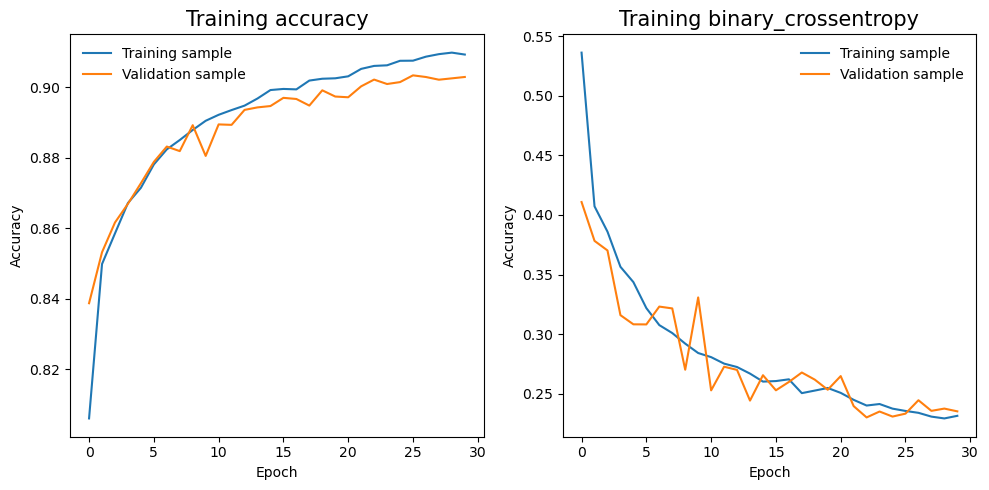

In [144]:
history_2_dict = history_2.history
print(history_2_dict.keys())

display_history(history_2_dict, metrics_choice)

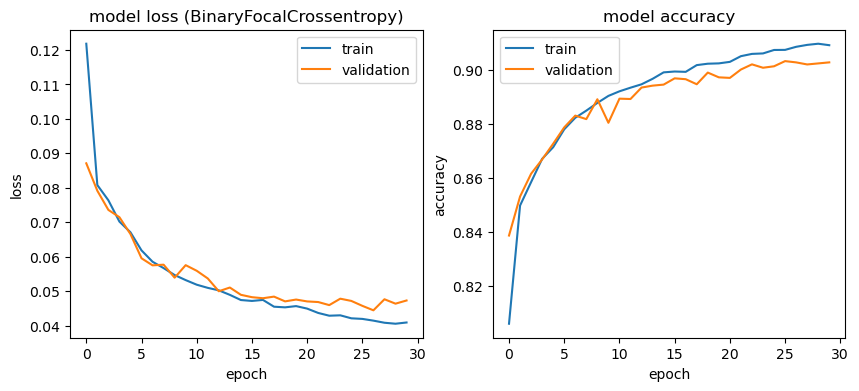

In [151]:
import matplotlib.pyplot as plt

figure, axes = plt.subplots(1, 2, figsize=(10, 4))
# loss
plt.subplot(1, 2, 1)
plt.plot(history_2.history['loss'], label='train')
plt.plot(history_2.history['val_loss'], label='test')

plt.title('model loss (BinaryFocalCrossentropy)')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')

# accuracy
plt.subplot(1, 2, 2)
plt.plot(history_2.history['accuracy'], label='train')
plt.plot(history_2.history['val_accuracy'], label='test')

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

#show
plt.show()

In [147]:
test_image_pred_2 = model.predict(images_test) # for final metric of success: labels_test

print(test_image_pred_2.shape)
test_image_pred_2[200]

16/16 [==============================] - 4s 241ms/step
(502, 256, 256, 1)


array([[[0.4201339 ],
        [0.401832  ],
        [0.4034615 ],
        ...,
        [0.4513533 ],
        [0.45808694],
        [0.44769502]],

       [[0.39938068],
        [0.3758556 ],
        [0.37068412],
        ...,
        [0.45495304],
        [0.47338215],
        [0.4570542 ]],

       [[0.3797136 ],
        [0.3440828 ],
        [0.33524707],
        ...,
        [0.48296392],
        [0.47244772],
        [0.46376002]],

       ...,

       [[0.47126842],
        [0.480188  ],
        [0.47908035],
        ...,
        [0.36673692],
        [0.3757338 ],
        [0.38605055]],

       [[0.47023243],
        [0.4769026 ],
        [0.47793913],
        ...,
        [0.3916605 ],
        [0.39779174],
        [0.40703908]],

       [[0.47555637],
        [0.48353875],
        [0.48325986],
        ...,
        [0.42842886],
        [0.43021291],
        [0.44040233]]], dtype=float32)

In [148]:
test_image_pred_t_2 = (test_image_pred_2 > 0.5).astype(np.uint8)
test_image_pred_t_2.shape
test_image_pred_t_2[200]

array([[[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       ...,

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]]], dtype=uint8)

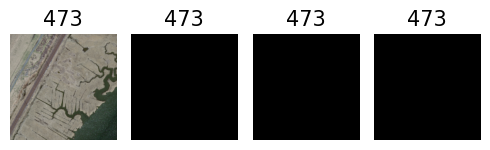

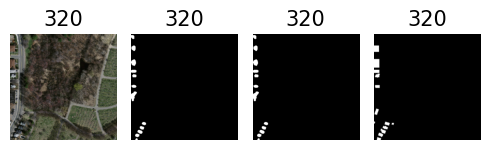

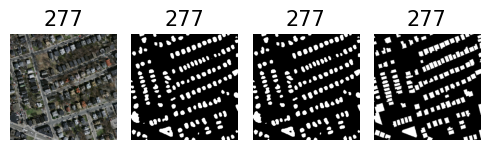

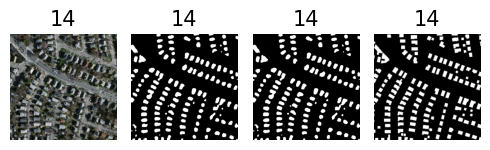

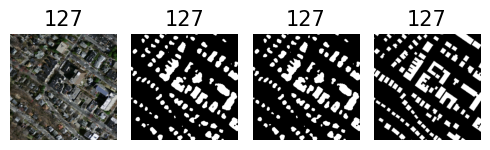

In [149]:
for i in np.random.choice(range(len(images_test)), 5, replace=False):
    compare([images_test[i],test_image_pred_t[i], test_image_pred_t_2[i], labels_test[i]], [i,i,i,i])

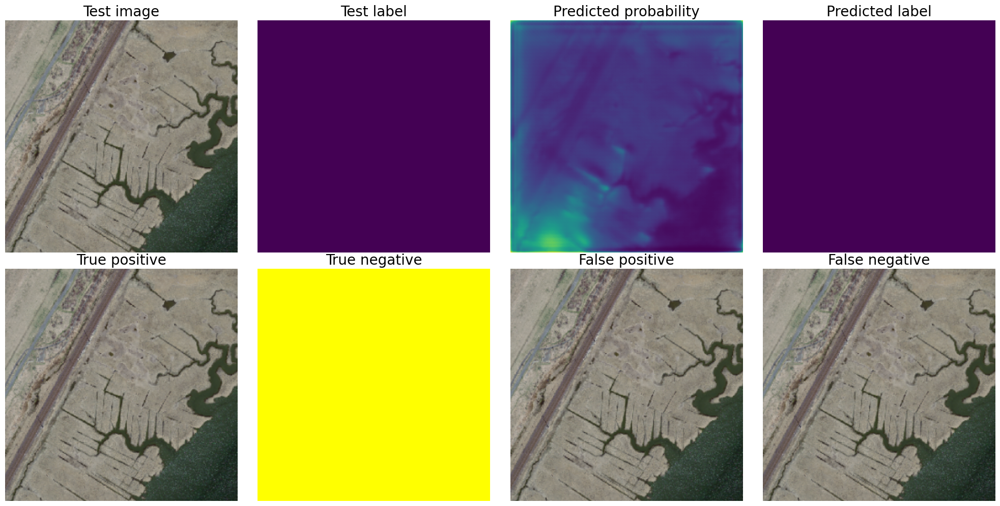

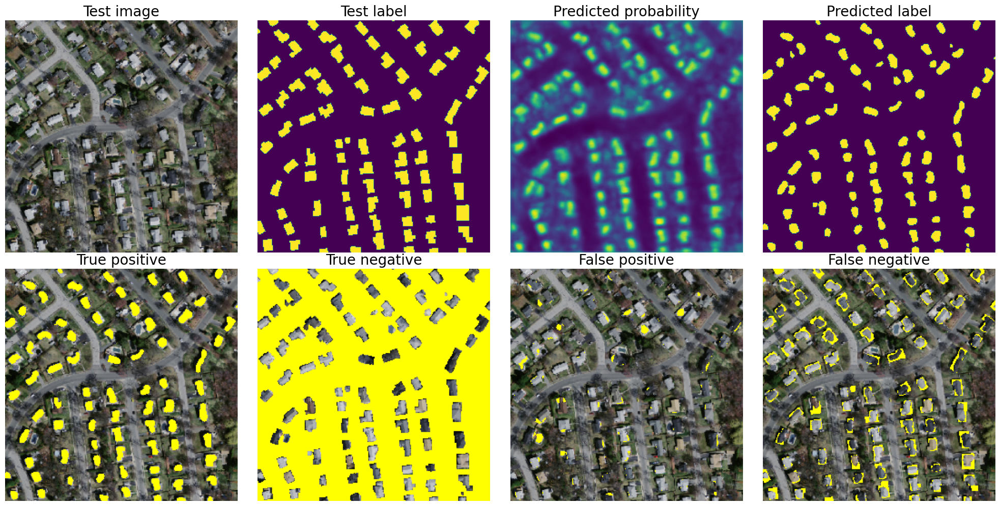

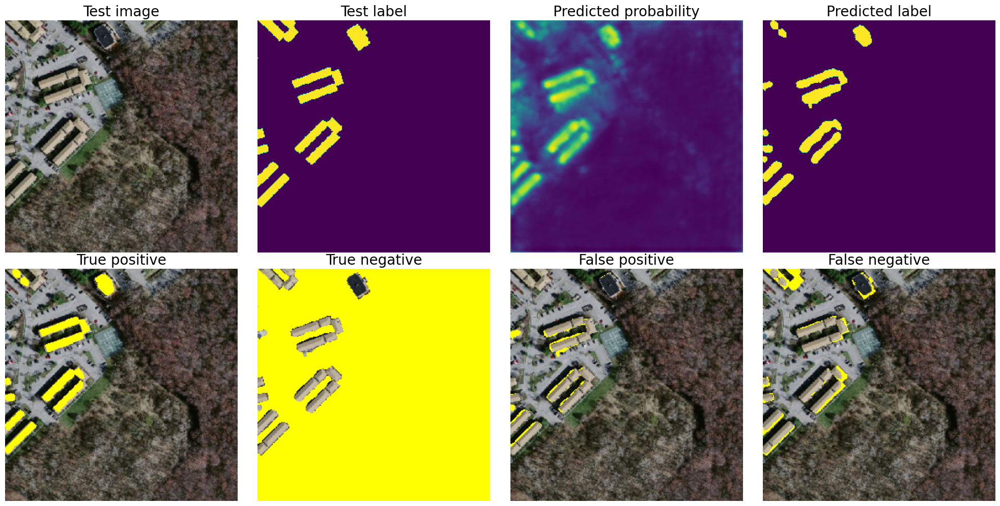

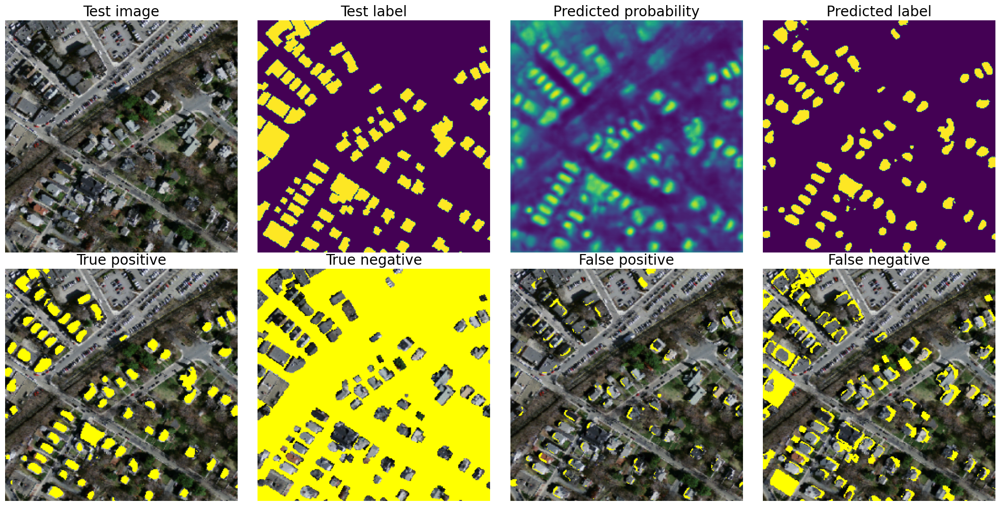

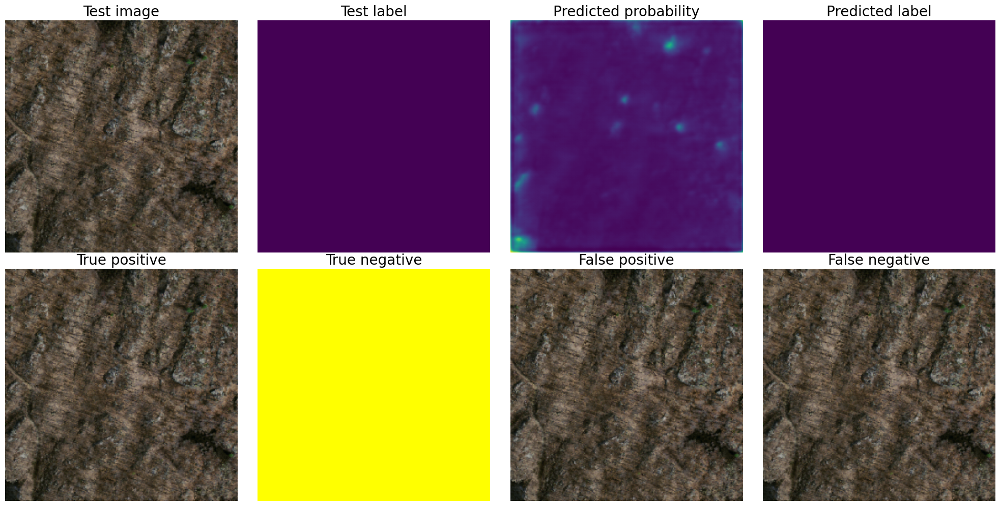

In [150]:
for i in np.random.choice(range(len(images_test)), 5, replace=False):
    display_statistics(images_test[i],labels_test[i], test_image_pred_2[i], test_image_pred_t[i])